# Tutorial 6: DLPFC interpolation
This tutorial primarily describes the process of using samples 151673 and 151675 to impute 151674.

## Environment Configuration & Package Loading

In [1]:
import os
import torch
import pandas as pd
import scanpy as sc
from GenOT import genot
import warnings

warnings.filterwarnings("ignore")
# Run device, by default, the package is implemented on 'cpu'. We recommend using GPU.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# the location of R, which is necessary for mclust algorithm. Please replace the path below with local R installation path
os.environ['R_HOME'] = 'C:/Program Files/R/R-4.4.1'
os.environ['PATH'] = 'C:/Program Files/R/R-4.4.1/bin/x64;' + os.environ['PATH']

C:\ProgramData\anaconda3\envs\pytorch\lib\site-packages\scipy\__init__.py:177: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Data Loading
We load three different Visium spatial transcriptomics datasets from the DLPFC (Dorsolateral Prefrontal Cortex) region. These datasets will be used for interpolation and analysis.

In [2]:
section_id = '151673'
input_dir = os.path.join('../Data', section_id)
adata1 = sc.read_visium(path=input_dir, count_file=section_id + '_filtered_feature_bc_matrix.h5', load_images=True)
adata1.var_names_make_unique(join="++")
print(adata1)
Ann_df = pd.read_csv(os.path.join(input_dir, section_id + '_truth.txt'), sep='\t', header=None, index_col=0)
Ann_df.columns = ['Ground Truth']
Ann_df[Ann_df.isna()] = "unknown"
adata1.obs['Ground Truth'] = Ann_df.loc[adata1.obs_names, 'Ground Truth'].astype('category')

section_id = '151675'
input_dir = os.path.join('../Data', section_id)
adata2 = sc.read_visium(path=input_dir, count_file=section_id + '_filtered_feature_bc_matrix.h5', load_images=True)
adata2.var_names_make_unique(join="++")
print(adata2)
Ann_df = pd.read_csv(os.path.join(input_dir, section_id + '_truth.txt'), sep='\t', header=None, index_col=0)
Ann_df.columns = ['Ground Truth']
Ann_df[Ann_df.isna()] = "unknown"
adata2.obs['Ground Truth'] = Ann_df.loc[adata2.obs_names, 'Ground Truth'].astype('category')

section_id = '151674'
input_dir = os.path.join('../Data', section_id)
adata3 = sc.read_visium(path=input_dir, count_file=section_id + '_filtered_feature_bc_matrix.h5', load_images=True)
# adata3 = sc.pp.subsample(adata3, n_obs=3000, random_state=0, copy=True)
adata3.var_names_make_unique(join="++")
print(adata3)
Ann_df = pd.read_csv(os.path.join(input_dir, section_id + '_truth.txt'), sep='\t', header=None, index_col=0)
Ann_df.columns = ['Ground Truth']
Ann_df[Ann_df.isna()] = "unknown"
adata3.obs['Ground Truth'] = Ann_df.loc[adata3.obs_names, 'Ground Truth'].astype('category')

AnnData object with n_obs × n_vars = 3639 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 3592 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 3673 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


## Normalize Data
Normalize the gene expression data for each AnnData object using `normalize_sparse`.
This step is crucial for consistent downstream analysis.

In [3]:
from GenOT.utils import normalize_sparse

adata1 = normalize_sparse(adata1)
adata2 = normalize_sparse(adata2)
adata3 = normalize_sparse(adata3)

## Visualize adata1, adata2, and adata3.
Visualize the spatial distribution of 'Ground Truth' annotations for each dataset.
This helps in understanding the tissue morphology and layer organization.

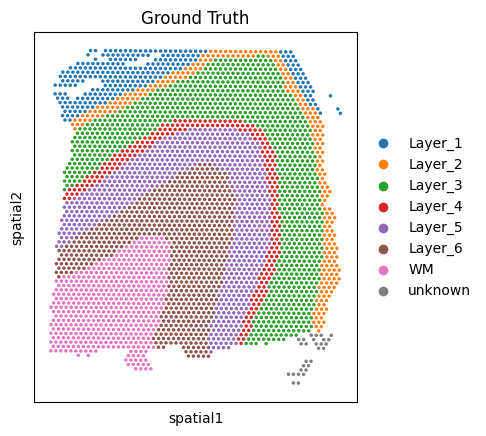

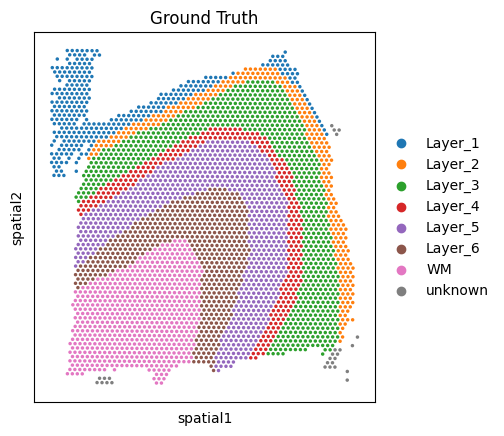

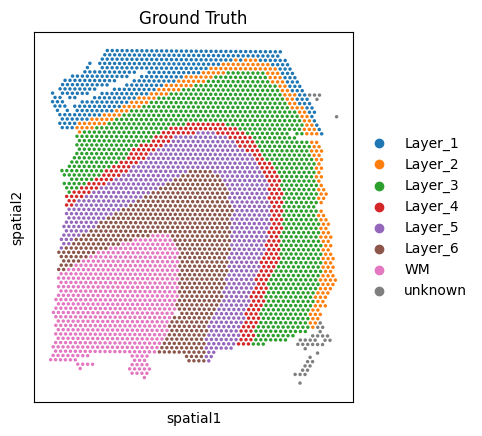

In [4]:
sc.pl.spatial(adata1, img_key=None, color='Ground Truth')
sc.pl.spatial(adata2, img_key=None, color='Ground Truth')
sc.pl.spatial(adata3, img_key=None, color='Ground Truth')

## Align the input datasets adata1 and adata2 using the PASTE2 algorithm.

PASTE2 is used to spatially align two AnnData objects by finding an optimal
transformation that minimizes the distance between corresponding spots.

PASTE2 starts...
Starting GLM-PCA...
Iteration: 0 | deviance=4.2825E+6
Iteration: 1 | deviance=4.2825E+6
Iteration: 2 | deviance=4.1865E+6
Iteration: 3 | deviance=4.0313E+6
Iteration: 4 | deviance=3.9559E+6
Iteration: 5 | deviance=3.9226E+6
Iteration: 6 | deviance=3.9048E+6
Iteration: 7 | deviance=3.8942E+6
Iteration: 8 | deviance=3.8876E+6
Iteration: 9 | deviance=3.8831E+6
Iteration: 10 | deviance=3.8797E+6
Iteration: 11 | deviance=3.8769E+6
Iteration: 12 | deviance=3.8747E+6
Iteration: 13 | deviance=3.8728E+6
Iteration: 14 | deviance=3.8712E+6
Iteration: 15 | deviance=3.8699E+6
Iteration: 16 | deviance=3.8687E+6
Iteration: 17 | deviance=3.8677E+6
Iteration: 18 | deviance=3.8668E+6
Iteration: 19 | deviance=3.8660E+6
Iteration: 20 | deviance=3.8653E+6
Iteration: 21 | deviance=3.8647E+6
Iteration: 22 | deviance=3.8641E+6
Iteration: 23 | deviance=3.8636E+6
Iteration: 24 | deviance=3.8631E+6
Iteration: 25 | deviance=3.8626E+6
Iteration: 26 | deviance=3.8622E+6
Iteration: 27 | deviance=3.8

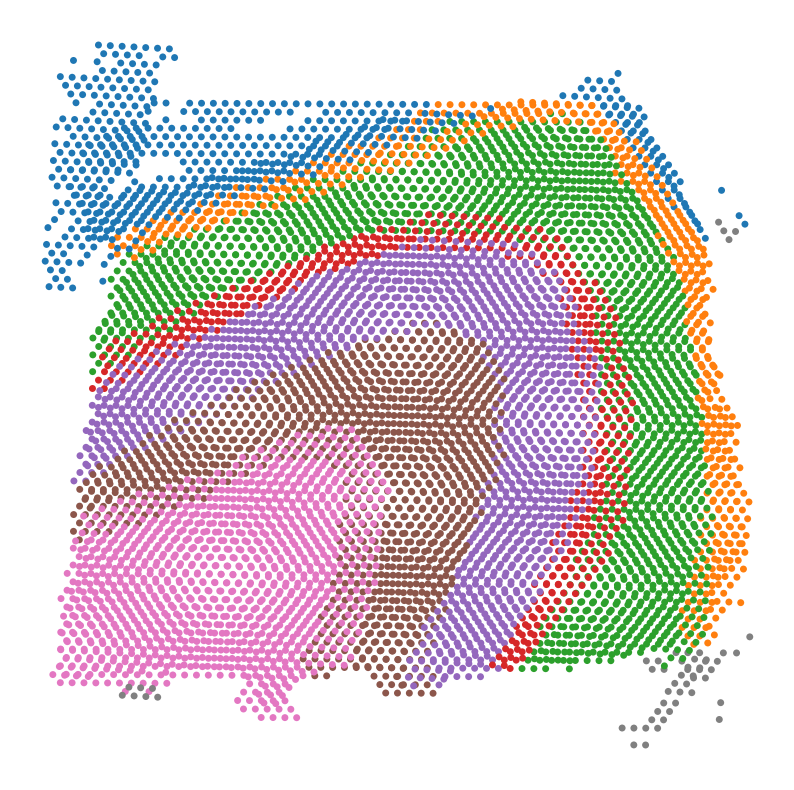

In [5]:
from GenOT.utils import PASTE2_align_spatial_data


adata1.obsm['spatial'], adata2.obsm['spatial'] = PASTE2_align_spatial_data(adata1, adata2, visualize=True)


Get unique marker genes from adata3 based on its 'Ground Truth' annotations.
These marker genes will be used to ensure consistent gene sets across all datasets.

In [6]:

from GenOT.utils import get_unique_marker_genes

unique_marker_genes = get_unique_marker_genes(adata3, annotation_column_name='Ground Truth', n_top_genes=10)


Using annotation column 'Ground Truth' for marker gene analysis...
Unique values in annotation column: ['Layer_3', 'Layer_1', 'WM', 'Layer_5', 'Layer_6', 'Layer_2', 'Layer_4', 'unknown']
Extracted 66 unique marker genes from the top 10 genes per annotation group.
First 10 extracted marker genes: ['AGR3', 'ATP1A1', 'AZGP1', 'B3GALT2', 'C11orf87', 'CA10', 'CARTPT', 'CBX6', 'CLDN11', 'CLDND1']...


## Data Preprocessing

This section preprocesses the data by ensuring all datasets contain the same set of genes,
specifically the marker genes identified earlier.

In [7]:
common_genes = set(unique_marker_genes) & set(adata1.var_names) & set(adata2.var_names) & set(adata3.var_names)
matching_genes = list(common_genes)

adata1 = adata1[:, matching_genes].copy()
adata2 = adata2[:, matching_genes].copy()
adata3 = adata3[:, matching_genes].copy()

## Run GenOT
This section initializes and trains the GenOT DualEncoder, which learns a shared
latent space representation for the input spatial transcriptomics datasets.

In [8]:
# define model
Encoder = genot.DualEncoder(adata1, adata2, device=device, pca_n=16)


In [9]:
adata1, adata2 = Encoder.train_encoder()

Training DualEncoder on 2 datasets with 700 epochs...


Training: 100%|██████████| 700/700 [00:22<00:00, 31.65it/s]

Training completed!


## Compute the spatial barycenter.

In [10]:
from GenOT.OTutils import compute_spatial_barycenter

Xb_s, s_transport_plans = compute_spatial_barycenter(adata1, adata2, num_barycenters=adata3.n_obs)

It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.526740e+07|0.000000e+00|0.000000e+00
    1|1.386171e+07|1.014077e-01|1.405685e+06
    2|1.386171e+07|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.560258e+07|0.000000e+00|0.000000e+00
    1|1.393915e+07|1.193348e-01|1.663426e+06
    2|1.393915e+07|0.000000e+00|0.000000e+00
It.  |Err         
-------------------
    0|1.269066e+07|
    0|1.608939e+05|
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.315560e+07|0.000000e+00|0.000000e+00
    1|1.751202e+06|6.512327e+00|1.140440e+07
    2|1.735259e+06|9.187614e-03|1.594289e+04
    3|1.733098e+06|1.247302e-03|2.161696e+03
    4|1.733098e+06|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.338249e+07|0.000000e+00|0.000000e+

## Run decoder
Initialize and train the GenOT Decoder. The decoder learns to reconstruct gene expression
from the latent space embeddings.

In [11]:
decoder = genot.Decoder(
    input_size=adata1.obsm['emb'].shape[1],  # Input dimension
    output_size=adata1.X.shape[1],  # Output dimension
)
# Train the decoder
trained_decoder = decoder.train_decoder(adata1, adata2, decoder, epochs=500, batch_size=2048)

100%|██████████| 500/500 [00:33<00:00, 14.73it/s]


In [12]:
# Extract the learned embeddings from adata1 and adata2.
embd0 = adata1.obsm['emb']
embd1 = adata2.obsm['emb']

## Compute the embedding barycenter for the latent representations.

In [13]:
from GenOT.OTutils import compute_emb_barycenter

Xb, e_transport_plans = compute_emb_barycenter(
    adata1, adata2,
    weight1=0.5,
    alpha=0.5,
    num_barycenters=adata3.n_obs
)


It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|4.741920e+01|0.000000e+00|0.000000e+00
    1|3.864771e+01|2.269601e-01|8.771488e+00
    2|3.864771e+01|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|3.640727e+01|0.000000e+00|0.000000e+00
    1|2.842808e+01|2.806795e-01|7.979181e+00
    2|2.840253e+01|8.997296e-04|2.555460e-02
    3|2.840253e+01|0.000000e+00|0.000000e+00
It.  |Err         
-------------------
    0|7.186842e+03|
    0|4.668437e+02|
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.402055e+01|0.000000e+00|0.000000e+00
    1|1.855133e+00|6.557708e+00|1.216542e+01
    2|1.846197e+00|4.840139e-03|8.935850e-03
    3|1.846197e+00|0.000000e+00|0.000000e+00
It.  |Loss        |Relative loss|Absolute loss
------------------------------------------------
    0|1.316487e+01|0.000000e+00|0.000000e+

Since the spatial barycenter and embedding barycenter reside in different spaces (not one-to-one cell correspondences), we align them by constraining the embedding barycenter. Refer to the [update_embedding_barycenter] function for details.

In [14]:
from GenOT.OTutils import update_embedding_barycenter

Xb = update_embedding_barycenter(Xb_s, Xb, s_transport_plans, e_transport_plans)


## Use the trained decoder to transform the embedding barycenter into gene expression values.

In [15]:
new_embedding = torch.tensor(Xb, dtype=torch.float32)
new_embedding = new_embedding.to("cuda" if torch.cuda.is_available() else "cpu")

trained_decoder.eval()
with torch.no_grad():
    reconstructed_features = trained_decoder(new_embedding)

reconstructed_gene_expression = reconstructed_features.cpu().numpy()

print("Reconstructed Features Shape:", reconstructed_gene_expression.shape)


Reconstructed Features Shape: (3673, 66)


Create a new adata object where the gene expression matrix equals the generated expression values, and spatial coordinates match the spatial barycenter.

In [16]:
new_adata = adata3.copy()
X = reconstructed_gene_expression.copy()
thresholds = X.max(axis=0) / 2
for i, threshold in enumerate(thresholds):
    X[:, i][X[:, i] < threshold] = 0
new_adata.X = X
new_adata.obsm['spatial'] = Xb_s

Map the generated gene expression data to the target dataset using the [create_mapped_adata] function.

In [17]:
from GenOT.OTutils import create_mapped_adata

mapped_adata = create_mapped_adata(new_adata, adata3, threshold_denominator=2)


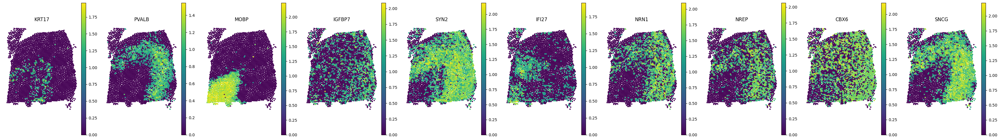

In [18]:
import matplotlib.pyplot as plt
import scanpy as sc

import random

genes_of_interest = list(common_genes)[:10]

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        new_adata,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=100,
        cmap='viridis',
        frameon=False,
        img_key=None
    )

plt.tight_layout()
plt.show()




 Visualize the mapped data, original datasets (adata1/151673 and adata2/151675), and the imputed dataset (adata3/151674)

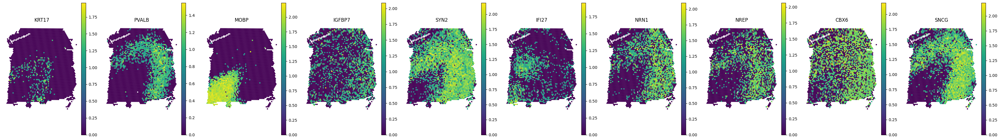

In [19]:
import matplotlib.pyplot as plt
import scanpy as sc

import random

genes_of_interest = list(common_genes)[:10]

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        mapped_adata,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=100,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()




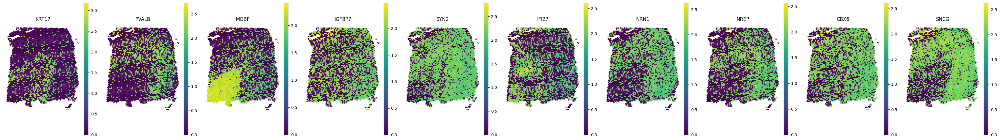

In [20]:

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        adata1,
        color=gene,
        ax=axes[i],
        img_key=None,
        title=gene,
        show=False,
        size=1.5,
        spot_size=100,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()

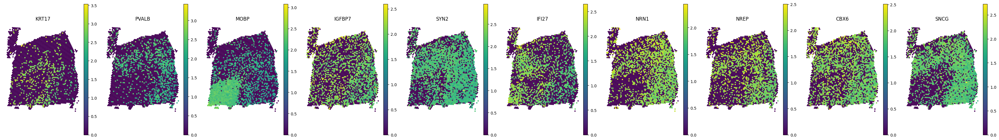

In [21]:


fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        adata2,
        color=gene,
        img_key=None,
        ax=axes[i],
        show=False,
        size=1.5,
        spot_size=100,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()

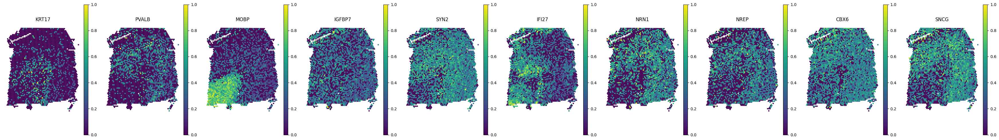

In [22]:

fig, axes = plt.subplots(1, 10, figsize=(35, 5))
plt.subplots_adjust(wspace=0.3)

for i, gene in enumerate(genes_of_interest):
    sc.pl.spatial(
        adata3,
        img_key=None,
        color=gene,
        ax=axes[i],
        title=gene,
        show=False,
        size=1.5,
        spot_size=100,
        cmap='viridis',
        frameon=False
    )

plt.tight_layout()
plt.show()

## Visualize the PCP4 gene expression across datasets.

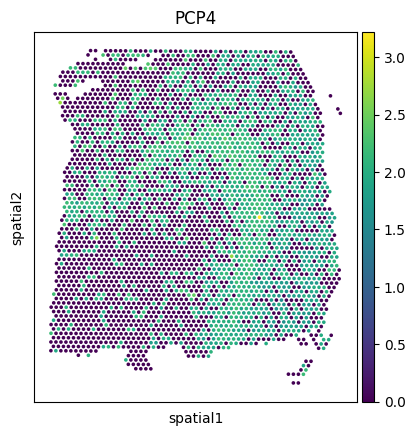

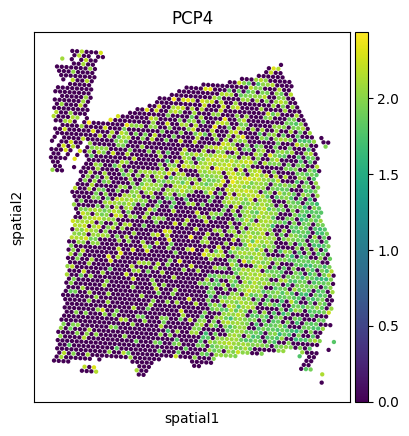

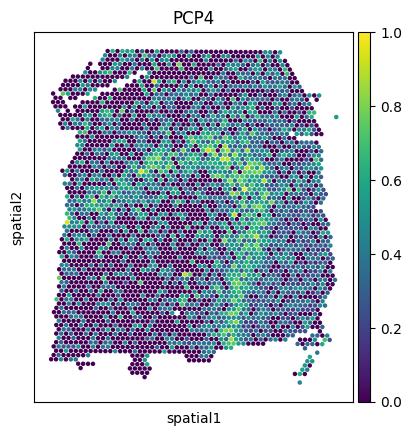

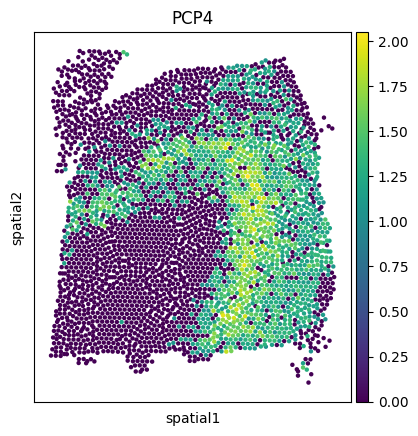

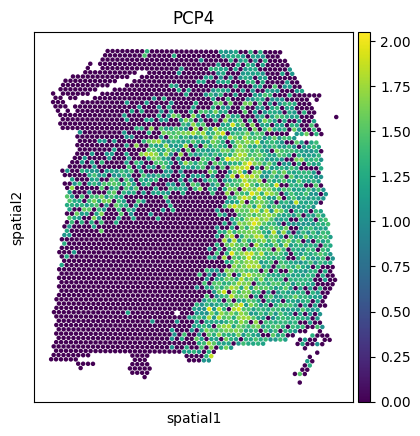

In [23]:
sc.pl.spatial(adata1, img_key=None, color='PCP4', cmap='viridis', size=2, spot_size=50)
sc.pl.spatial(adata2, img_key=None, color='PCP4', cmap='viridis', size=2.5, spot_size=50)
sc.pl.spatial(adata3, img_key=None, color='PCP4', cmap='viridis', size=2.5, spot_size=50)
sc.pl.spatial(new_adata, img_key=None, color='PCP4', cmap='viridis', size=2.5, spot_size=50)
sc.pl.spatial(mapped_adata, img_key=None, color='PCP4', cmap='viridis', size=2.5, spot_size=50)

Starting comparison for 66 common genes...


Calculating gene SSIM scores: 100%|██████████| 66/66 [01:02<00:00,  1.05it/s]



Analysis complete! Processed 66 genes
Mean SSIM: 0.9873 ± 0.0033
Median SSIM: 0.9871



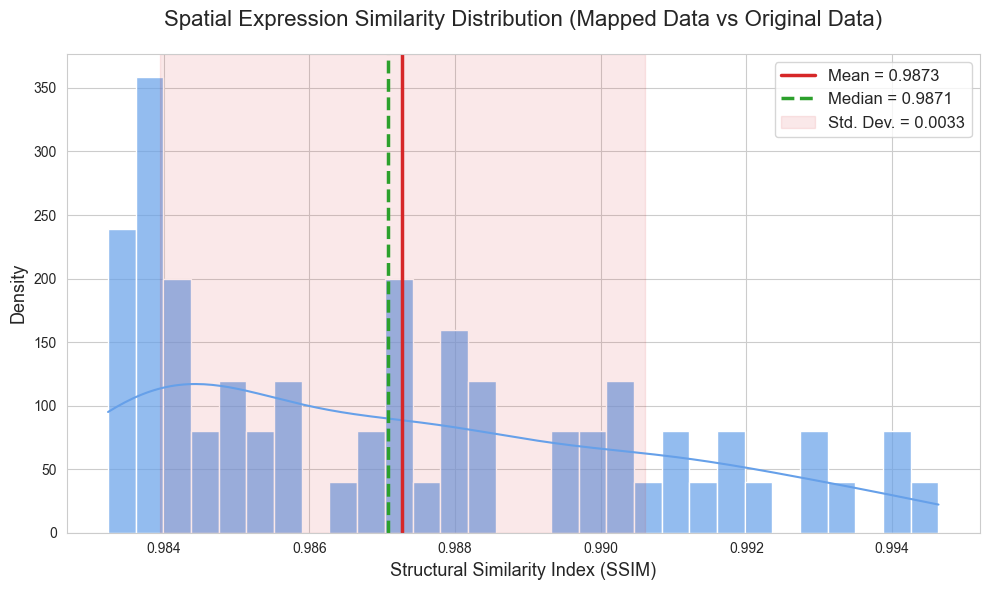

In [24]:

from GenOT.plotting import compare_spatial_expression_all_genes
# Compare the spatial expression patterns between the mapped (imputed) data and the original target data.
# This function calculates and plots similarity metrics (e.g., SSIM) for all genes.
mean_ssim, scores_df = compare_spatial_expression_all_genes(
    adata1=mapped_adata,
    adata1_name="Mapped Data",
    adata2=adata3,
    adata2_name="Original Data",
    max_genes=None,
    output_csv=None,
    plot_file=None,
    figsize=(10, 6)
)


--- Starting gene embedding metric calculation ---
Original adata shape: (3673, 66)
Original mapped_adata shape: (3673, 66)
Transposed adata_g1 shape (genes x cells): (66, 3673)
Transposed adata_g2 shape (genes x cells): (66, 3673)
Found 66 common genes for analysis.
adata_g1 shape after common gene filtering: (66, 3673)
adata_g2 shape after common gene filtering: (66, 3673)

Performing PCA (16 dimensions) for both datasets...
Gene embedding dimensions for Dataset 1: (66, 16)
Gene embedding dimensions for Dataset 2: (66, 16)

Calculating similarity metrics: PCC, Cosine Similarity, RMSE, JS Divergence...

--- Metric calculation complete ---

--- Generating distribution plots for similarity metrics ---
Average PCC: 0.5518
Average Cosine Similarity: 0.5618
Average RMSE: 9.7619
Average JS Divergence: 0.4180


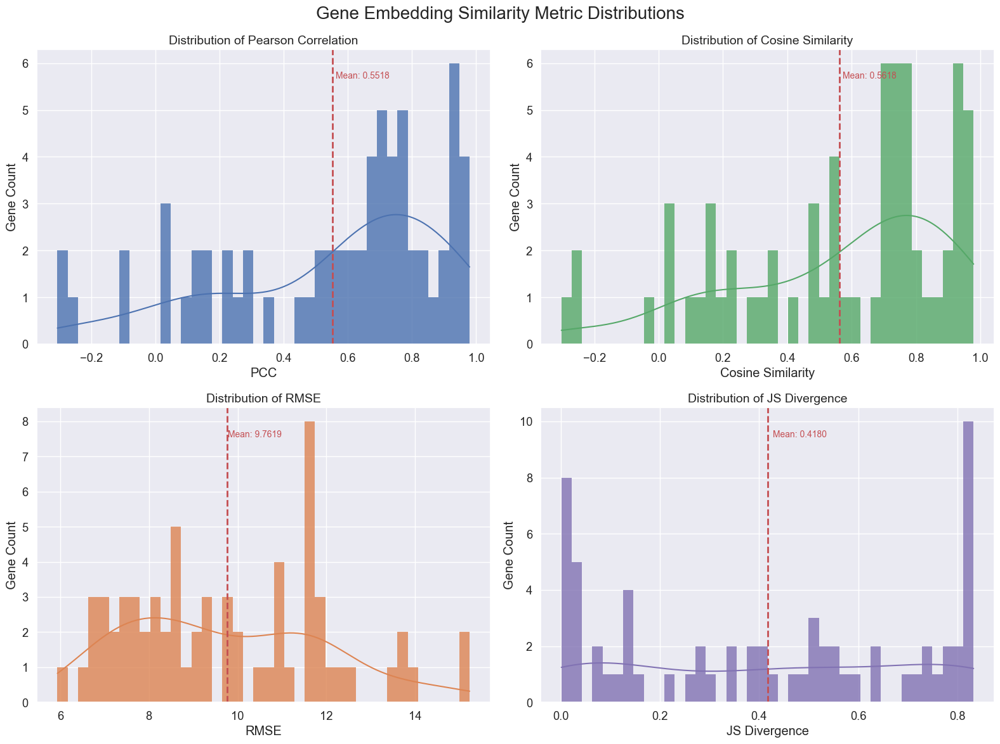


--- Visualization complete ---


In [25]:
from GenOT.plotting import calculate_gene_embedding_metrics, plot_gene_embedding_metrics_distributions
# Calculate various metrics to evaluate the quality of the gene embeddings derived from the imputation.
# These metrics assess how well the imputed gene expression preserves the original's gene-embedding relationships.
df = calculate_gene_embedding_metrics(adata3, mapped_adata, n_pca_components=16)
# Plot the distributions of these calculated gene embedding metrics.
plot_gene_embedding_metrics_distributions(df)